## Classify Parkinson's disease brain with structural brain MRI image
- The data set is from Parkinson's Progression Markers Initiatives (PPMI): 54 PD, 55 Control
- Preprocessing: \
a. realign the T1 sequence to AC-PC lines in CAT12\
b. Transform and segment out gray matter with assistance of CAT12\
c. Smooth the segmented gray matter with 6 * 6 * 6 kernel

In [1]:
import numpy as np
import sklearn.decomposition as skd
import matplotlib.pyplot as plt
import os
import nibabel as nb
from nilearn import plotting
import pandas as pd
from icasso import Icasso
from sklearn.decomposition import FastICA
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import random
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR, SVC
from sklearn.metrics import mean_absolute_error
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.feature_selection import SelectPercentile, f_regression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, roc_curve, auc, make_scorer, f1_score
from statistics import mean

## Read the files into the program first
- Subjects: 54 PD, 55 Control
- Preprocessing: SPM12, transform into MNI space and segment the gray matter, the segmented GM would further smoothing with 6*6*6 kernels.

In [2]:
PATH="/Volumes/Expansion/PD_brain_project/data/segment_data/sGM"
GM_files=os.listdir(PATH)
GM_files_counts=len(GM_files)

## Reshape the images from 3D array to 1D array

In [3]:
file_matrix=[]
img_sample=nb.load(os.path.join(PATH,GM_files[0]))
a,b,c=img_sample.shape
def matrix_maker(files):
    global file_matrix
    global PATH
    global a,b,c
    for i in range(len(files)):
        img_matrix=nb.load(os.path.join(PATH,files[i])).get_fdata()
        img_matrix_new=np.reshape(img_matrix,a*b*c)
        file_matrix.append(img_matrix_new)
    return file_matrix

gray_matter=np.asanyarray(matrix_maker(GM_files))                 

## Import Demographic data & Split the data 
- import baseline data: extract age & group and make it as new array named as age_arr, and y_group_arr
- Standardize the scale of age_arr
- Split the data: train 80%, test 20%

In [4]:
PATH2='/Volumes/Expansion/PD_brain_project/data/demographic'
PD=pd.read_csv(os.path.join(PATH2,'PD_brain_ML_project_PD_5_26_2023.csv'))
Con=pd.read_csv(os.path.join(PATH2,'PD_brain_ML_project_5_26_2023.csv'))
demo_data=pd.concat([PD,Con],axis=0).reset_index()
y_group=[]
age=[]
container=[]
for i, item in enumerate(GM_files):
    for j, ID in enumerate(demo_data['Image Data ID']):
        if str(ID) in item and item not in container:
            y_group.append(demo_data._get_value(j,'Group'))
            age.append(demo_data._get_value(j,'Age'))
            container.append(item)

y_group_arr=np.array(y_group)
y_group_arr[y_group_arr=='PD']=1
y_group_arr[y_group_arr=='Control']=-1
y_group_arr=y_group_arr.astype('float')
age_arr=np.array(age)
age_arr=age_arr.reshape(len(age_arr),1)

In [5]:
scaler=StandardScaler()
age_arr_std=scaler.fit_transform(age_arr)
X_train, X_test, y_train, y_test, age_train, age_test = train_test_split(gray_matter, y_group_arr, age_arr_std, 
                                                                         train_size=0.8, stratify=y_group_arr,shuffle=True)

## Apply FastICA algorithm from sklearn
- try icasso package (https://github.com/Teekuningas/icasso)
- The icasso would yield source matrix(component*voxels). The mixing matrix(subjects*components) would be yielded after then.
- cut one of the compoenents out of the source matrix to see the pattern.

In [7]:
ica_params={
    'n_components':20
}

def bootstrap_fun(data, generator):
    return data[generator.choice(range(data.shape[0]), size=data.shape[0]), :]

def unmixing_fun(ica):
    return ica.components_

icasso=Icasso(skd.FastICA,ica_params=ica_params,iterations=20,bootstrap=True,vary_init=True)
icasso.fit(data=X_train,fit_params={},random_state=60,bootstrap_fun=bootstrap_fun,unmixing_fun=unmixing_fun)

/Users/mattpro/anaconda3/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/Users/mattpro/anaconda3/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/Users/mattpro/anaconda3/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/Users/mattpro/anaconda3/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/Users/mattpro/anaconda3/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(
/Users/mattpro/anaconda3/lib/python3.10/site-

In [8]:
W_,score=icasso.get_centrotype_unmixing(distance=0.1)
S_=np.dot(W_,X_train.T).T

/Users/mattpro/anaconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



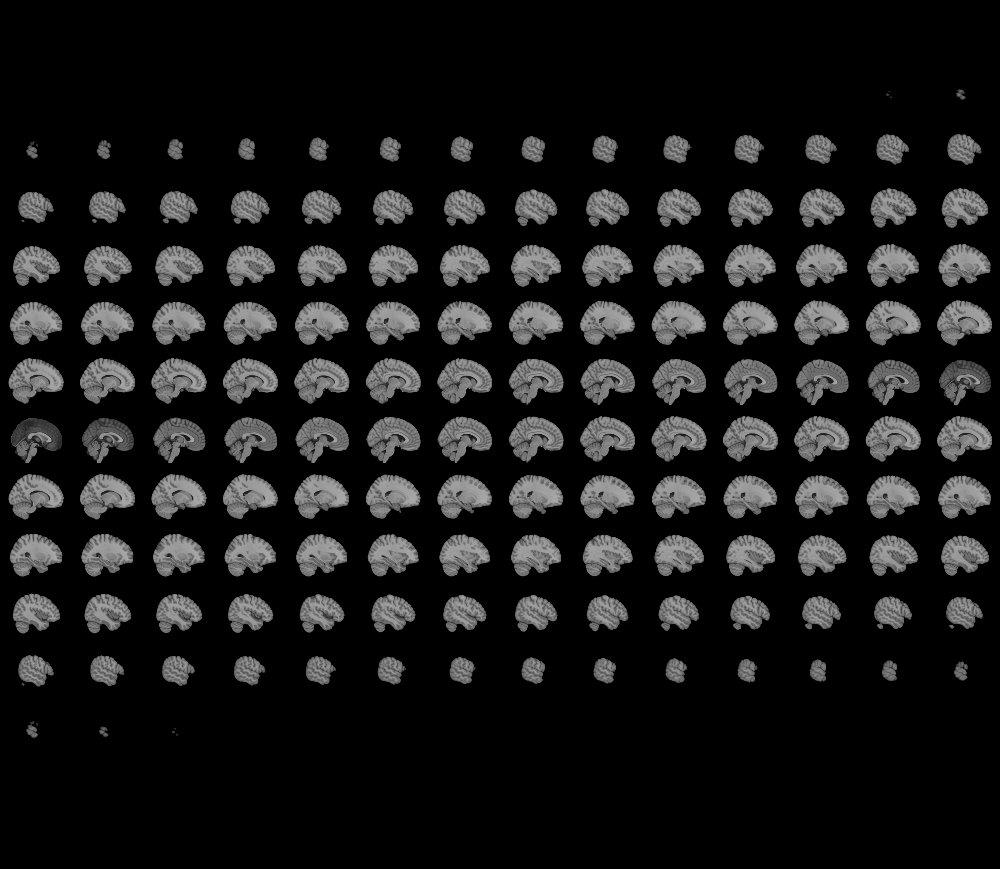
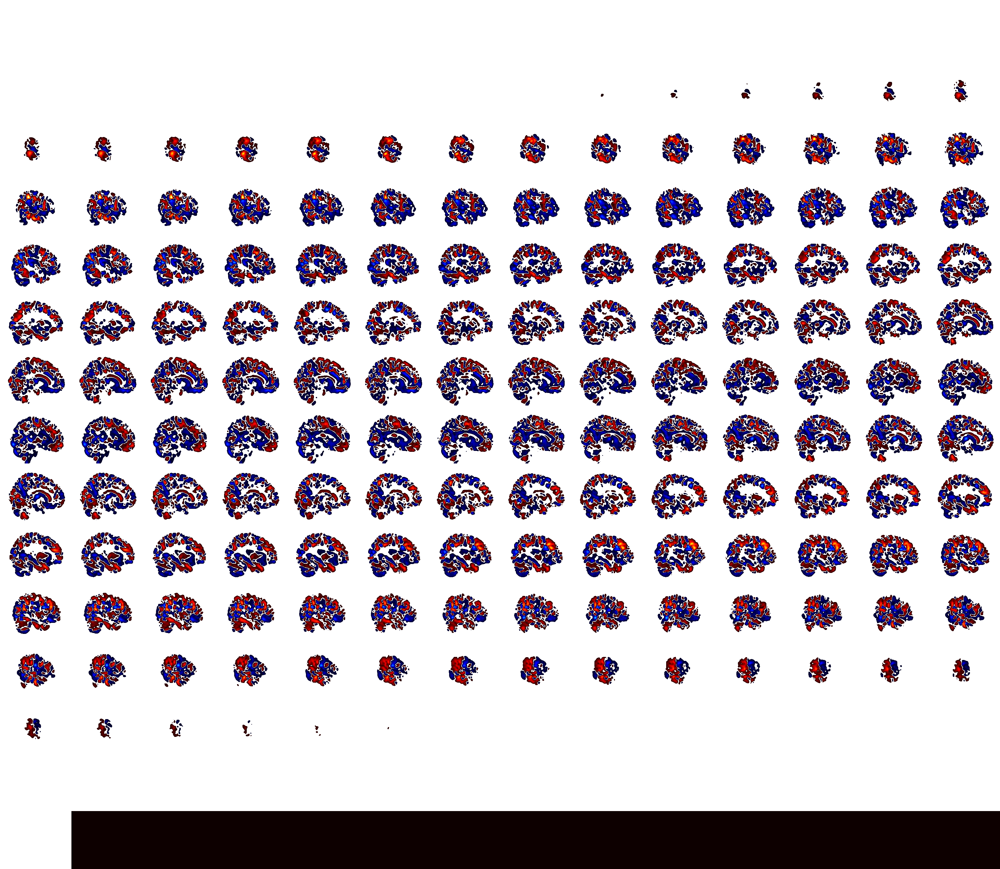

In [9]:
cm1=W_[0].reshape(a,b,c)
cm1_img=nb.Nifti1Image(cm1,affine=img_sample.affine)
plotting.view_img(cm1_img)

## Cluster the independent components to see if any consistant components
- Use Kmeans and set the number of clusters as 4 initially
- plot the clusters: Unfortunately, the results showed no obvious discretion on the data (May be due to smaller size?).
- Choose one of the clusters and add overlay on the map

/Users/mattpro/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


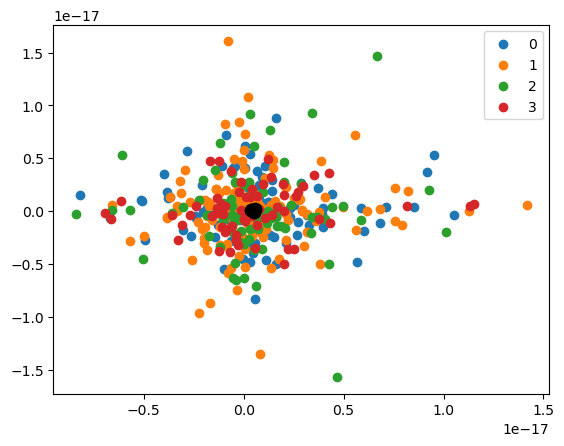

In [10]:
# Cluster the ICs to see if any specific structural networks
kmeans=KMeans(n_clusters=4)
label=kmeans.fit_predict(W_)
centroid=kmeans.cluster_centers_
u_labels = np.unique(label)
 
for i in u_labels:
    plt.scatter(W_[label == i , 0] , W_[label == i , 1] , label = i)
plt.scatter(centroid[:,0],centroid[:,1],s=80,color='k')
plt.legend()
plt.show()

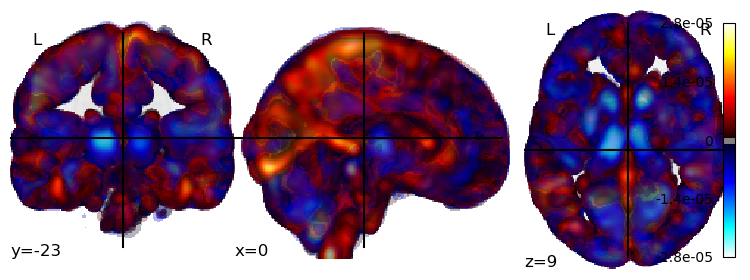

In [11]:
label2=W_[label==2]

img_collect={}
label20=label2[0].reshape(a,b,c)
label20_img=nb.Nifti1Image(label20,affine=img_sample.affine)
display=plotting.plot_stat_map(label20_img,cmap='cold_hot',alpha=0.5)
for i in range(1,len(label2)):
    img=label2[i].reshape(a,b,c)
    img_collect[i]=nb.Nifti1Image(img,affine=img_sample.affine)
    display.add_overlay(img_collect[i],cmap='cold_hot',alpha=0.3)
    

- Further apply PCA on the results of ICASSO mixing matrix to see if it could further make some comsistant features

In [12]:
## Extra part: try to use PCA to lower the dimensionality for the result of ICASSO
pca_ica=skd.PCA(n_components=0.9, svd_solver='full')
pca_ica.fit(S_)
pca_ica_mat=pca_ica.transform(S_)

## Apply PCA algorithm from sklearn
- first to find the possible numbers of components in PCA models: the components, which could explain around 80% data, is around 60.
- slice one of the components to see the pattern

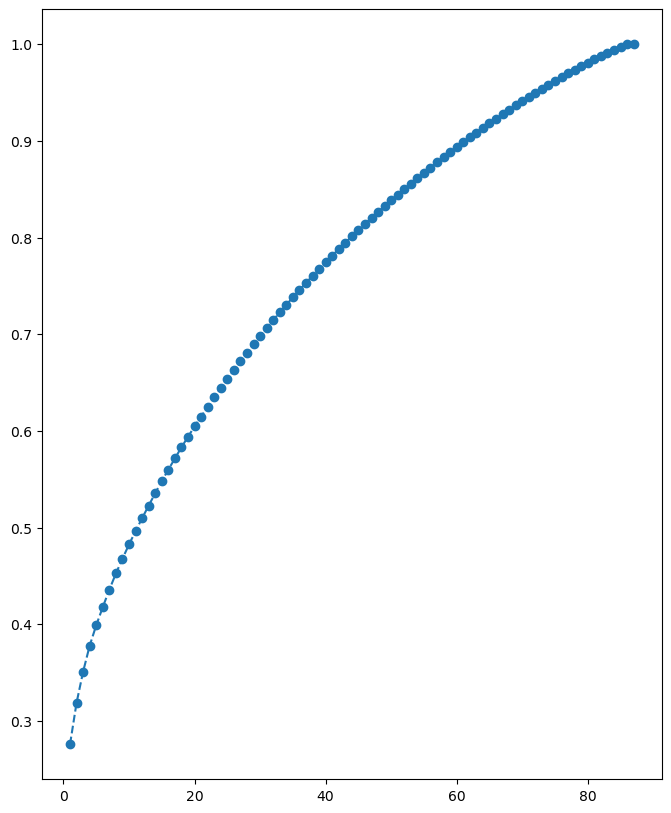

In [13]:
pca_c=skd.PCA()
pca_c.fit(X_train)
pca_c.explained_variance_ratio_
plt.figure(figsize=(8,10))
plt.plot(range(1,len(X_train)+1),pca_c.explained_variance_ratio_.cumsum(),marker='o',linestyle='--')

In [14]:
n_components_pca=60
pca=skd.PCA(n_components=n_components_pca)
pca.fit(X_train)
pca_new=pca.transform(X_train)

/Users/mattpro/anaconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



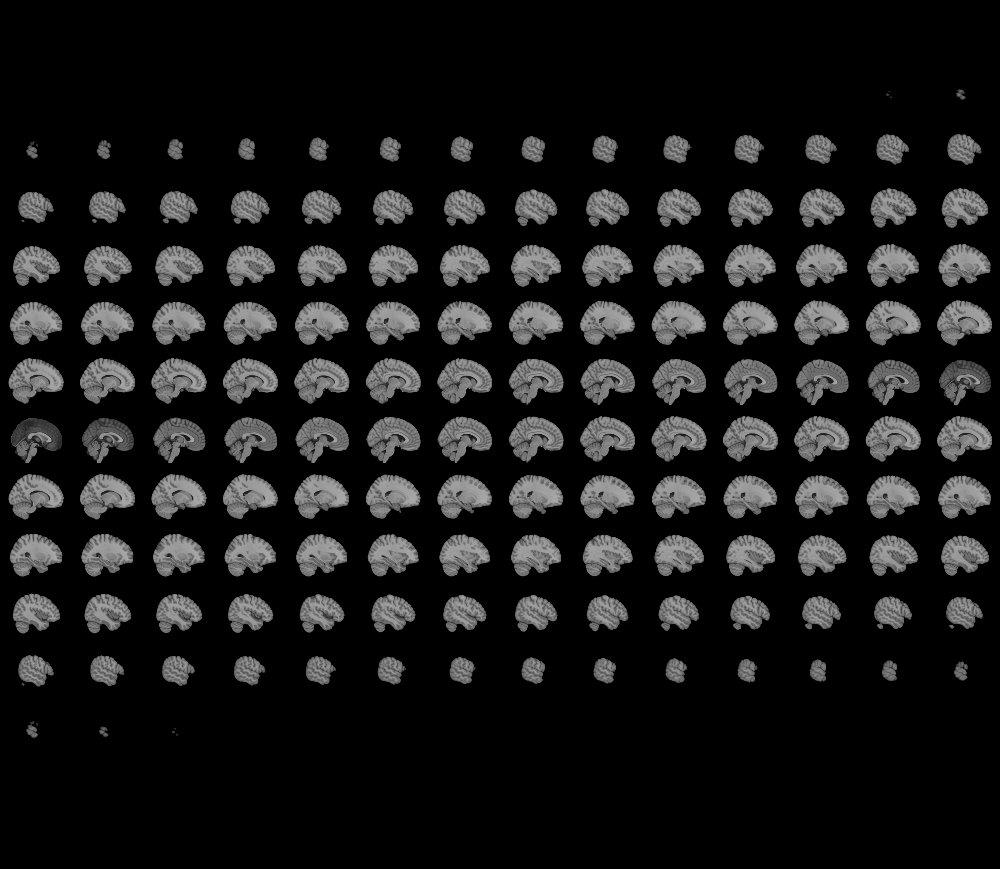
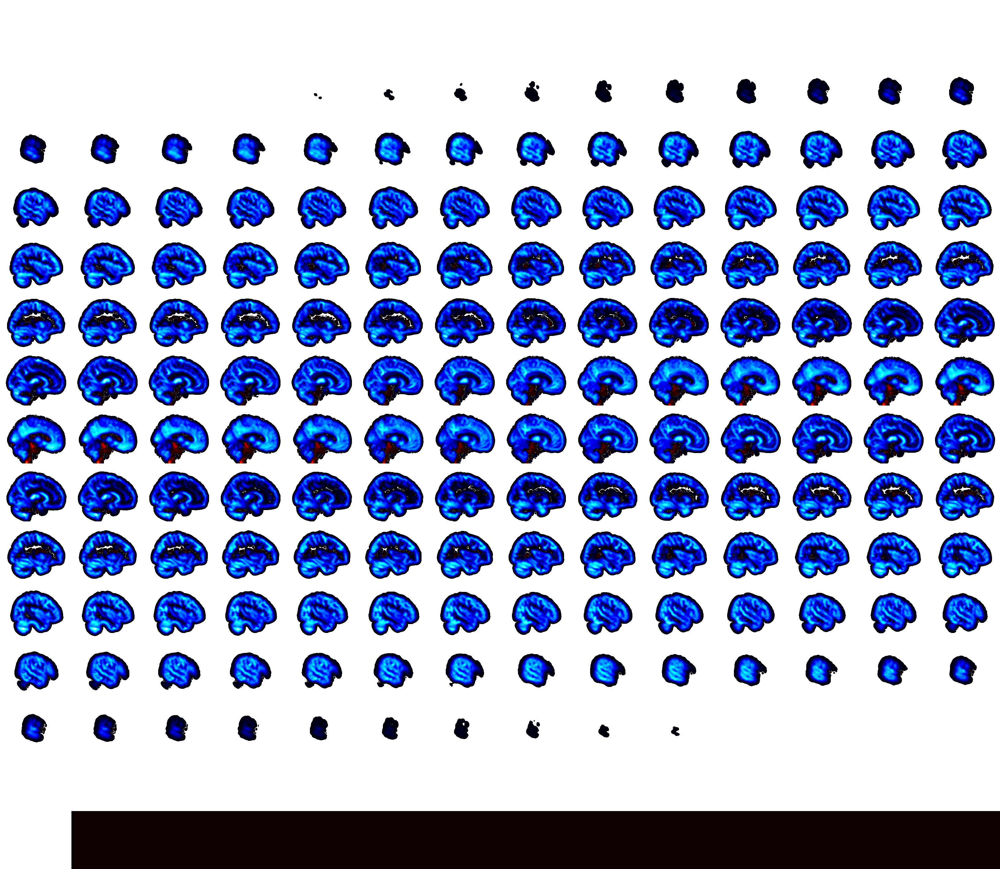

In [15]:
components1=pca.components_[0].reshape(a,b,c)
components1_img=nb.Nifti1Image(components1,affine=img_sample.affine)
plotting.view_img(components1_img)

- Further try to cluster the components of PCA and find the nadir (Elbow method) to find the possible number of clusters for the results of PCA.

/Users/mattpro/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/mattpro/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/mattpro/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/mattpro/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/mattp

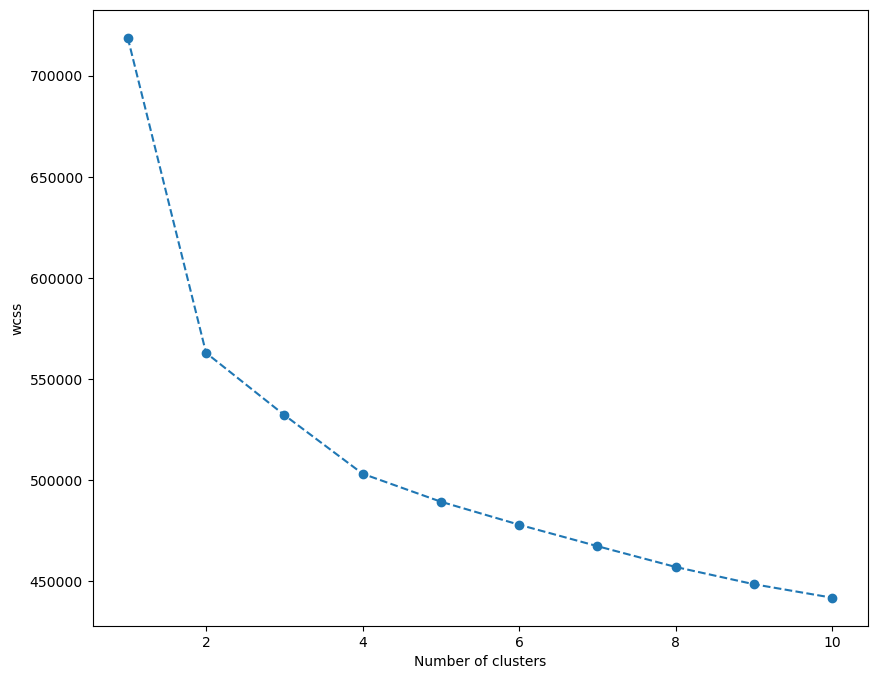

In [17]:
# Cluster the ICs of PCA
wcss=[]
for i in range(1,11):
    kmeans_pca=KMeans(n_clusters=i,init='k-means++',random_state=72)
    kmeans_pca.fit(pca_new)
    wcss.append(kmeans_pca.inertia_)

plt.figure(figsize=(10,8))
plt.plot(range(1,11),wcss,marker='o',linestyle='--')
plt.xlabel('Number of clusters')
plt.ylabel('wcss')
plt.show()

/Users/mattpro/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


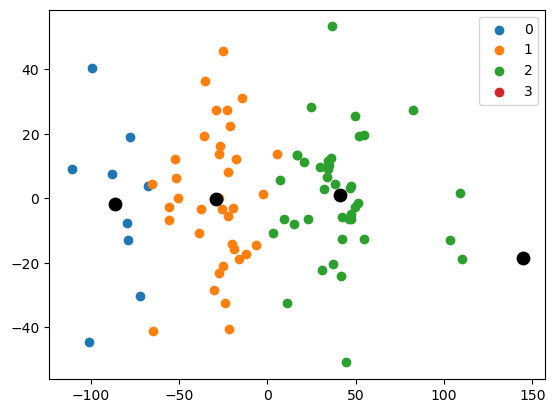

In [18]:
kmeans=KMeans(n_clusters=4)
label=kmeans.fit_predict(pca_new)
centroid=kmeans.cluster_centers_
u_labels = np.unique(label)
 
for i in u_labels:
    plt.scatter(pca_new[label == i , 0] , pca_new[label == i , 1] , label = i)
plt.scatter(centroid[:,0],centroid[:,1],s=80,color='k')
plt.legend()
plt.show()

## Put the extracted features into SVM
- two main function to decide the best parameters of the model with higher f1 score during the cross-validation process via GridSearchCV(function: get_best_model). Secondly, select the optimal top features to improve the prediction of the model.
- concatenate age into the features(mixing matrix of ICA and PCA) as one of the regressor
- first try ICA algorithm. Second, try PCA algorithm. Third, try PCA after ICA algorithm.

In [19]:
def max_acu(pred_list):
    for i, item in enumerate(pred_list):
        if item== max(pred_list):
            return i, item
        
def scorer(y_true,y_pred):
    from sklearn import metrics as metrics
    f1=metrics.f1_score(y_true,y_pred)
    return f1
        
def get_best_model(feature_matrix,model,params,percentile=20):
    X_train,y_train=feature_matrix
    y_pred_f1_mean=[]
    for i in range(percentile):
        y_pred_score=[]
        model_train = Pipeline([
            ('feature_selection',SelectPercentile(f_regression,percentile=i+1)),
            ('prediction', check_best_params(feature_matrix,model,params))
                        ])
        skf = KFold(n_splits=5, shuffle=True, random_state=120)

        for tr_ind, te_ind in skf.split(X_train):
            X_tr = X_train[tr_ind]
            y_tr = y_train[tr_ind]
            X_te = X_train[te_ind]
            y_te = y_train[te_ind]
            model_train.fit(X_tr, y_tr) 
            predictions = model_train.predict(X_te)
            score=scorer(y_te,predictions)
            y_pred_score.append(score)
        y_pred_f1_mean.append(mean(y_pred_score))
        
    idx, max_val=max_acu(y_pred_f1_mean)
    model_best=Pipeline([
        ('feature_selection',SelectPercentile(f_regression,percentile=idx+1)),
        ('prediction', model)
                    ])
    return model_best
        


def check_best_params(feature_matrix,model,params):
    X_train,y_train=feature_matrix
    
    grid = GridSearchCV(model, param_grid=params_grid, cv=10,scoring='f1')
    grid.fit(X_train, y_train)
    good_estimator=grid.best_estimator_
   
    return good_estimator

In [20]:
#First part: split the ICA data in to train and test and put mixing matrix into SVM
age_train=age_train.reshape(len(X_train),1)
mix_age_train=np.concatenate((S_,age_train),axis=1)

l_svc=SVC()
C_range=10. ** np.arange(-3,8)
gamma_range=['scale','auto']
kernel_choice=['linear','poly','rbf']
params_grid=dict(kernel=kernel_choice, C=C_range,gamma=gamma_range)

data_ica=[mix_age_train,y_train]

model_good_ica=get_best_model(data_ica,l_svc,params_grid,percentile=30)
model_good_ica.fit(mix_age_train,y_train)


Pipeline(steps=[('feature_selection',
                 SelectPercentile(percentile=30,
                                  score_func=<function f_regression at 0x7f79286f2710>)),
                ('prediction', SVC())])

In [21]:
X_test_arr=np.dot(W_,X_test.T).T
mix_age_test=np.concatenate((X_test_arr,age_test),axis=1)
y_pred_ica=model_good_ica.predict(mix_age_test)
mae = mean_absolute_error(y_true=y_test,y_pred=y_pred_ica)

MAE =  0.7272727272727273


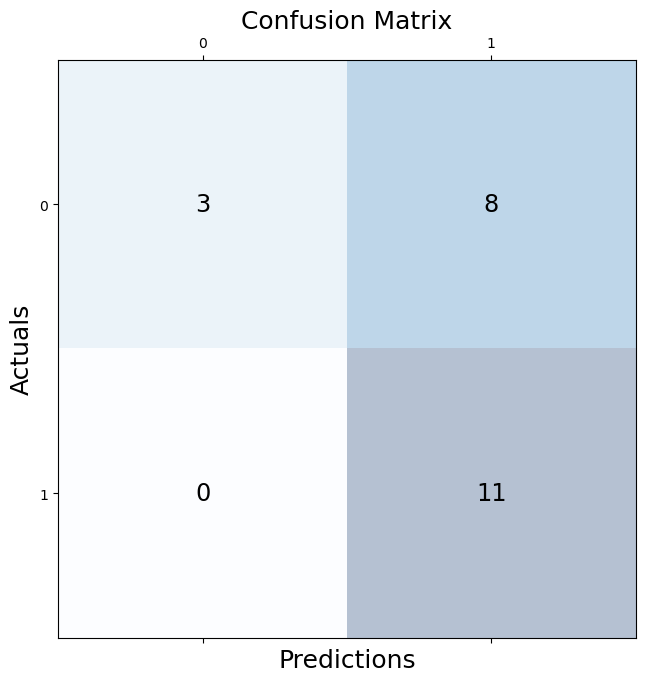

Accuracy:  0.64
Precision:  0.58
Recall:  1.0
F1-score:  0.73


In [22]:
print('MAE = ',mae)
y_pred_ica[y_pred_ica>0]=1
y_pred_ica[y_pred_ica<0]=-1

conf_matrix=confusion_matrix(y_true=y_test,y_pred=y_pred_ica)
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

tn, fp, fn, tp = conf_matrix.ravel()
# Calculate accuracy
accuracy = (tp + tn) / (tp + tn + fp + fn)
 
# Calculate precision
precision = tp / (tp + fp)
 
# Calculate recall
recall = tp / (tp + fn)
 
# Calculate F1-score
f1_score_ica = 2 * (precision * recall) / (precision + recall)
print("Accuracy: ", round(accuracy, 2))
print("Precision: ", round(precision, 2))
print("Recall: ", round(recall, 2))
print("F1-score: ", round(f1_score_ica, 2))

In [23]:
fpr_ica,tpr_ica,thresholds_ica=roc_curve(y_test, y_pred_ica)
auc_ica=auc(fpr_ica,tpr_ica)
print('The AUC value is:',auc_ica)

The AUC value is: 0.6363636363636364


In [24]:
#Second part: put PCA matrix into SVM
mix_age_train2=np.concatenate((pca_new,age_train),axis=1)
data_pca= [mix_age_train2,y_train]

l_svc=SVC()
C_range=10. ** np.arange(-3,8)
gamma_range=['scale','auto']
kernel_choice=['linear','poly','rbf']
params_grid=dict(kernel=kernel_choice, C=C_range,gamma=gamma_range)

model_good_pca=get_best_model(data_pca,l_svc,params_grid,percentile=30)

model_good_pca.fit(mix_age_train2,y_train)

X_test_arr2=pca.transform(X_test)
mix_age_test2=np.concatenate((X_test_arr2,age_test),axis=1)
y_pred_pca=model_good_pca.predict(mix_age_test2)
mae2 = mean_absolute_error(y_true=y_test,y_pred=y_pred_pca)

MAE =  0.8181818181818182


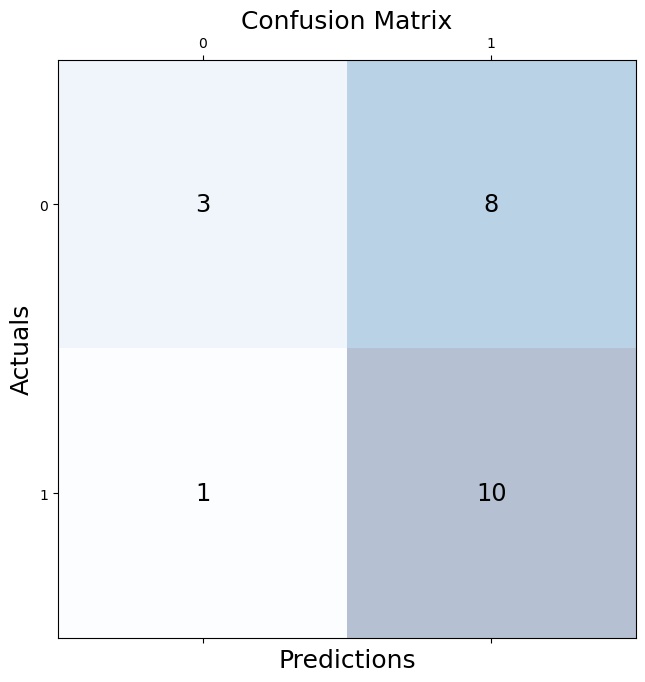

Accuracy:  0.59
Precision:  0.56
Recall:  0.91
F1-score:  0.69


In [25]:
print('MAE = ',mae2)
y_pred_pca[y_pred_pca>0]=1
y_pred_pca[y_pred_pca<0]=-1
conf_matrix_pca=confusion_matrix(y_true=y_test,y_pred=y_pred_pca)
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix_pca, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix_pca.shape[0]):
    for j in range(conf_matrix_pca.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix_pca[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

tn, fp, fn, tp = conf_matrix_pca.ravel()
# Calculate accuracy
accuracy = (tp + tn) / (tp + tn + fp + fn)
 
# Calculate precision
precision = tp / (tp + fp)
 
# Calculate recall
recall = tp / (tp + fn)
 
# Calculate F1-score
f1_score_pca = 2 * (precision * recall) / (precision + recall)
print("Accuracy: ", round(accuracy, 2))
print("Precision: ", round(precision, 2))
print("Recall: ", round(recall, 2))
print("F1-score: ", round(f1_score_pca, 2))

In [26]:
fpr_pca,tpr_pca,thresholds_pca=roc_curve(y_test, y_pred_pca)
auc_pca=auc(fpr_pca,tpr_pca)
print('The AUC value is:', auc_pca)

The AUC value is: 0.5909090909090908


In [27]:
# Third part: Do PCA after ICA and put it into SVM
mix_age_train3=np.concatenate((pca_ica_mat,age_train),axis=1)
data_ica_pca = [mix_age_train3,y_train]

l_svc=SVC()
C_range=10. ** np.arange(-3,8)
gamma_range=['scale','auto']
kernel_choice=['linear','poly','rbf']
params_grid=dict(kernel=kernel_choice, C=C_range,gamma=gamma_range)

model_good_pica=get_best_model(data_ica_pca,l_svc,params_grid,percentile=30)

model_good_pica.fit(mix_age_train3,y_train)

X_test_arr3=pca_ica.transform(X_test_arr)
mix_age_test3=np.concatenate((X_test_arr3,age_test),axis=1)
y_pred_pica=model_good_pica.predict(mix_age_test3)
mae3 = mean_absolute_error(y_true=y_test,y_pred=y_pred_pica)

MAE =  0.8181818181818182


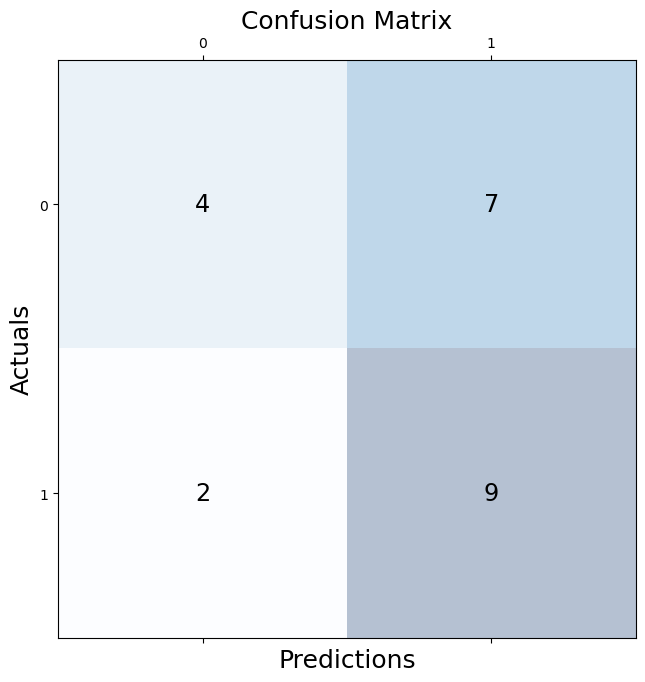

Accuracy:  0.59
Precision:  0.56
Recall:  0.82
F1-score:  0.67


In [28]:
print('MAE = ',mae3)
y_pred_pica[y_pred_pica>0]=1
y_pred_pica[y_pred_pica<0]=-1
conf_matrix_pica=confusion_matrix(y_true=y_test,y_pred=y_pred_pica)
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix_pica, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix_pica.shape[0]):
    for j in range(conf_matrix_pica.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix_pica[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

tn, fp, fn, tp = conf_matrix_pica.ravel()
# Calculate accuracy
accuracy = (tp + tn) / (tp + tn + fp + fn)
 
# Calculate precision
precision = tp / (tp + fp)
 
# Calculate recall
recall = tp / (tp + fn)
 
# Calculate F1-score
f1_score_pica = 2 * (precision * recall) / (precision + recall)
print("Accuracy: ", round(accuracy, 2))
print("Precision: ", round(precision, 2))
print("Recall: ", round(recall, 2))
print("F1-score: ", round(f1_score_pica, 2))

In [29]:
fpr_pica,tpr_pica,thresholds_pica=roc_curve(y_test, y_pred_pica)
auc_pica=auc(fpr_pica,tpr_pica)
print('The AUC value is:',auc_pica)

The AUC value is: 0.590909090909091


## Try to use Random Forest model to train the model 

In [30]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier()

n_estimator_choice=[100,200,500]
criterion_choice=['gini','entropy','log_loss']
params_grid=dict(n_estimators=n_estimator_choice,criterion=criterion_choice)

model_good_ica_rfc=get_best_model(data_ica,rfc,params_grid,percentile=30)
model_good_ica_rfc.fit(mix_age_train,y_train)
y_pred_ica_rfc=model_good_ica_rfc.predict(mix_age_test)
mae_rfc = mean_absolute_error(y_true=y_test,y_pred=y_pred_ica_rfc)

MAE =  0.36363636363636365


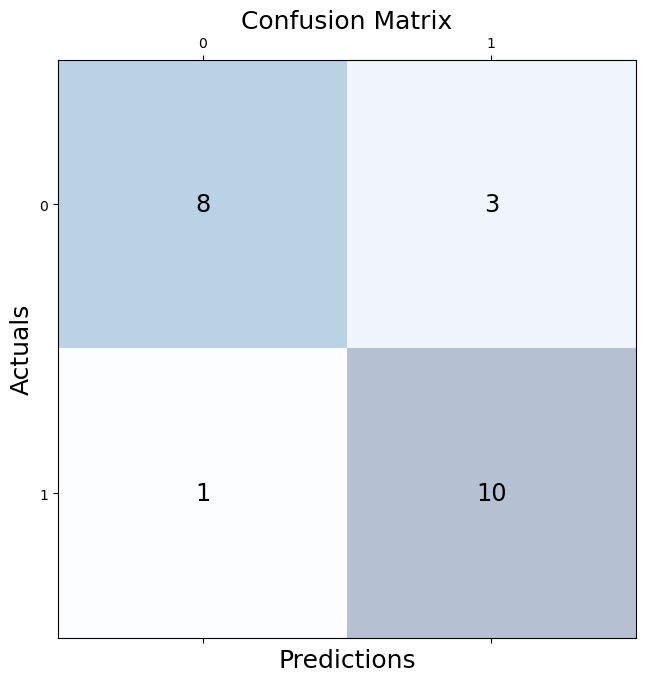

Accuracy:  0.82
Precision:  0.77
Recall:  0.91
F1-score:  0.83


In [31]:
print('MAE = ',mae_rfc)
y_pred_ica_rfc[y_pred_ica_rfc>0]=1
y_pred_ica_rfc[y_pred_ica_rfc<0]=-1

conf_matrix=confusion_matrix(y_true=y_test,y_pred=y_pred_ica_rfc)
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

tn, fp, fn, tp = conf_matrix.ravel()
# Calculate accuracy
accuracy = (tp + tn) / (tp + tn + fp + fn)
 
# Calculate precision
precision = tp / (tp + fp)
 
# Calculate recall
recall = tp / (tp + fn)
 
# Calculate F1-score
f1_score_ica = 2 * (precision * recall) / (precision + recall)
print("Accuracy: ", round(accuracy, 2))
print("Precision: ", round(precision, 2))
print("Recall: ", round(recall, 2))
print("F1-score: ", round(f1_score_ica, 2))

In [32]:
fpr_rfc,tpr_rfc,thresholds_rfc=roc_curve(y_test, y_pred_ica_rfc)
auc_rfc=auc(fpr_rfc,tpr_rfc)
print('The AUC value is:', auc_rfc)

The AUC value is: 0.8181818181818182


- Fit pca data into random forest model

In [33]:
n_estimator_choice=[100,200,500]
criterion_choice=['gini','entropy','log_loss']
params_grid=dict(n_estimators=n_estimator_choice,criterion=criterion_choice)

model_good_pca_rfc=get_best_model(data_pca,rfc,params_grid,percentile=30)
model_good_pca_rfc.fit(mix_age_train2,y_train)
y_pred_pca_rfc=model_good_pca_rfc.predict(mix_age_test2)
mae_pca_rfc = mean_absolute_error(y_true=y_test,y_pred=y_pred_pca_rfc)

MAE =  0.7272727272727273


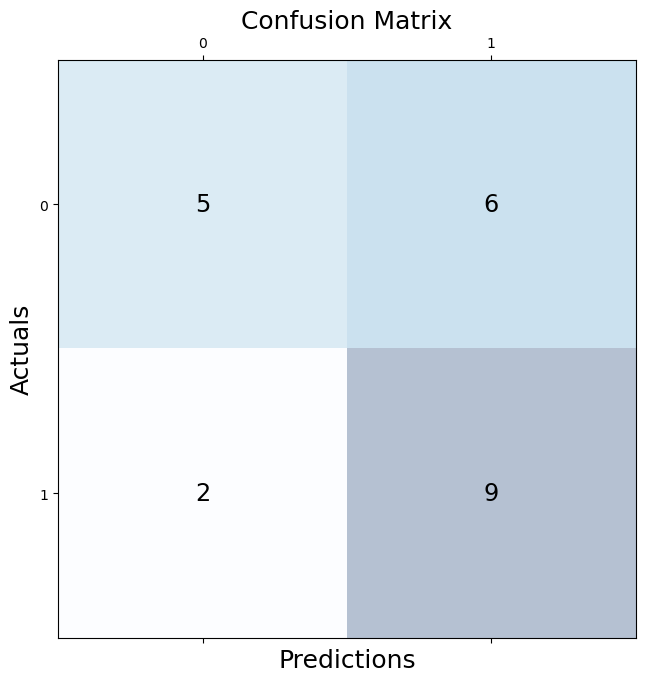

Accuracy:  0.64
Precision:  0.6
Recall:  0.82
F1-score:  0.69


In [34]:
print('MAE = ',mae_pca_rfc)
y_pred_pca_rfc[y_pred_pca_rfc>0]=1
y_pred_pca_rfc[y_pred_pca_rfc<0]=-1

conf_matrix=confusion_matrix(y_true=y_test,y_pred=y_pred_pca_rfc)
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

tn, fp, fn, tp = conf_matrix.ravel()
# Calculate accuracy
accuracy = (tp + tn) / (tp + tn + fp + fn)
 
# Calculate precision
precision = tp / (tp + fp)
 
# Calculate recall
recall = tp / (tp + fn)
 
# Calculate F1-score
f1_score_pca = 2 * (precision * recall) / (precision + recall)
print("Accuracy: ", round(accuracy, 2))
print("Precision: ", round(precision, 2))
print("Recall: ", round(recall, 2))
print("F1-score: ", round(f1_score_pca, 2))

In [35]:
fpr_pca_rfc,tpr_pca_rfc,thresholds_pca_rfc=roc_curve(y_test, y_pred_pca_rfc)
auc_pca_rfc=auc(fpr_pca_rfc,tpr_pca_rfc)
print('The AUC value is:', auc_pca_rfc)

The AUC value is: 0.6363636363636365
